In [6]:
import numpy as np
import batman
import corner
import argparse
import exoparams
import json
import matplotlib
import matplotlib.pyplot as plt
import pygtc

from datetime import datetime
from os import environ
from pandas import DataFrame
from scipy import special
from sklearn.externals import joblib
from functools import partial
from lmfit import Parameters, Minimizer, report_errors
from multiprocessing import cpu_count, Pool
from scipy import spatial
from statsmodels.robust import scale
from time import time
from warnings import filterwarnings
filterwarnings('ignore')

# SYNOD methods and assisting routines:
import synod
from synod import utils
from synod import models
from synod import bliss
from synod import krdata as kr
from synod import pld
from synod.utils import plot_fit_residuals_physics

In [7]:
# Global constants.
y,x = 0,1
ppm = 1e6
day_to_seconds = 86400
zero = 0.0

color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
fit_type = {True: 'mcmc', False:'mle'}

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [10]:
"""
Qatar-2b_ch1_2.5_0.0_bliss_mcmc_1000steps_100walkers_20180909112305.joblib.save
Qatar-2b_ch1_2.5_0.0_krdata_mcmc_1000steps_100walkers_20180908141606.joblib.save
Qatar-2b_ch1_2.5_0.0_pca_pld_mcmc_1000steps_1000walkers_20180912091642.joblib.save
Qatar-2b_ch1_2.5_0.0_pld_mcmc_100steps_100walkers_20180913090026.joblib.save
Qatar-2b_ch2_2.5_0.0_bliss_mcmc_1000steps_100walkers_20180909043517.joblib.save
Qatar-2b_ch2_2.5_0.0_krdata_mcmc_1000steps_100walkers_20180909035512.joblib.save
"""
save_dir = '/Users/jonathan/Research/Planets/PhaseCurves/Keep_For_Now/'


from glob import glob
mcmc_joblib_files = sorted(glob(save_dir + '*mcmc*joblib*'))

mcmc_stack = {}
for fname in mcmc_joblib_files:
    plant_name = fname.split('_')[0]
    method = fname.split('_mcmc_')[0].split('_')[-1]
    channel = fname.split('Qatar-2b_')[1].split('_')[0]
    staticRad = fname.split(channel+'_')[1].split('_')[0]
    varRad = fname.split(staticRad+'_')[1].split('_')[0]
    n_steps = fname.split('steps')[0].split('_')[-1]
    n_walkers = fname.split('walkers')[0].split('_')[-1]
    time_stamp = fname.split('.joblib.')[0].split('_')[-1]
    
    if 'pca' in fname: method = 'pca_' + method
    
    print('Loading {} {} {} {} {} {} {} {}'.format(planet_name, method, channel, staticRad, varRad, n_steps, n_walkers, time_stamp))
    
    if channel not in mcmc_stack.keys(): mcmc_stack[channel] = {}
    
    mcmc_stack[channel][method] = joblib.load(fname)

Loading qatar2_planet_params.json bliss ch1 2.5 0.0 1000 100 20180914192703
Loading qatar2_planet_params.json krdata ch1 2.5 0.0 1000 100 20180915045150
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1000 1000 20180917204849
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1000 1000 20180918090908
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1000 1000 20180919153129
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1000 1000 20180919201830
Loading qatar2_planet_params.json pld ch1 2.5 0.0 100 1000 20180918090908
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1 100 20180918071943
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1 100 20180918085124
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1 100 20180918085335
Loading qatar2_planet_params.json pld ch1 2.5 0.0 1 100 20180918090908
Loading qatar2_planet_params.json pld ch1 2.5 0.0 200 1000 20180918090908
Loading qatar2_planet_params.json pld ch1 2.5 0.0 500 1000 20180918090908
Loading qatar2_planet_params.json bliss c

In [11]:
type(mcmc_stack['ch1']['bliss'].flatchain)

pandas.core.frame.DataFrame

In [24]:
np.std(thingies[0]['night_flux'])

323.09824723733635

Saving PyGTC ch1 to qatar2_planet_params.json_ch1_2.5_0.0_all3_mcmc_pygtc_combo_cornerplot.png


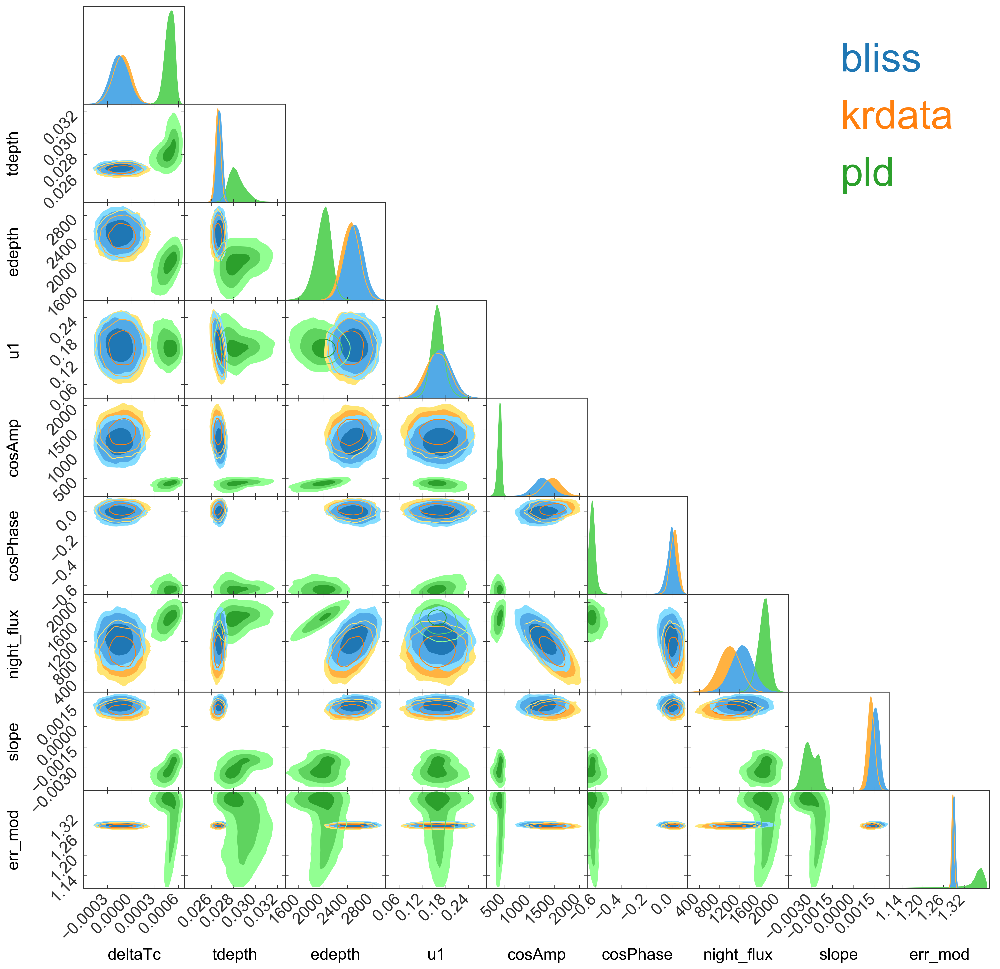

In [14]:
thingies = [val.flatchain.drop([colname for colname in val.flatchain.columns if 'pld' in colname or 'weird' in colname or 'deltaEc' in colname or 't_start' in colname], axis=1) for val in mcmc_stack['ch1'].values()]

for thingy in thingies: thingy['cosAmp'] = thingy['cosAmp']*ppm
for thingy in thingies: thingy['night_flux'] = thingy['night_flux']*ppm
for thingy in thingies: thingy['edepth'] = thingy['cosAmp']*np.cos(thingy['cosPhase']) + thingy['night_flux']

pygtc_out = pygtc.plotGTC(thingies, figureSize=20, nContourLevels=3, 
                          customLegendFont={'family':'Arial', 'size':50},
                          customLabelFont={'family':'Arial', 'size':20},
                          customTickFont={'family':'Arial', 'size':20},
                          chainLabels = list(mcmc_stack['ch1'].keys()))

pygtc_save_name = '{}_{}_{}_{}_{}_{}_pygtc_combo_cornerplot.png'.format(planet_name.replace(' ',''), 'ch1', staticRad, varRad, 'all3', 'mcmc')
print('Saving PyGTC {} to {}'.format('ch1', pygtc_save_name))
# pygtc_out.savefig(pygtc_save_name)

Saving PyGTC ch1 to qatar2_planet_params.json_ch2_2.5_0.0_all3_mcmc_pygtc_combo_cornerplot.png


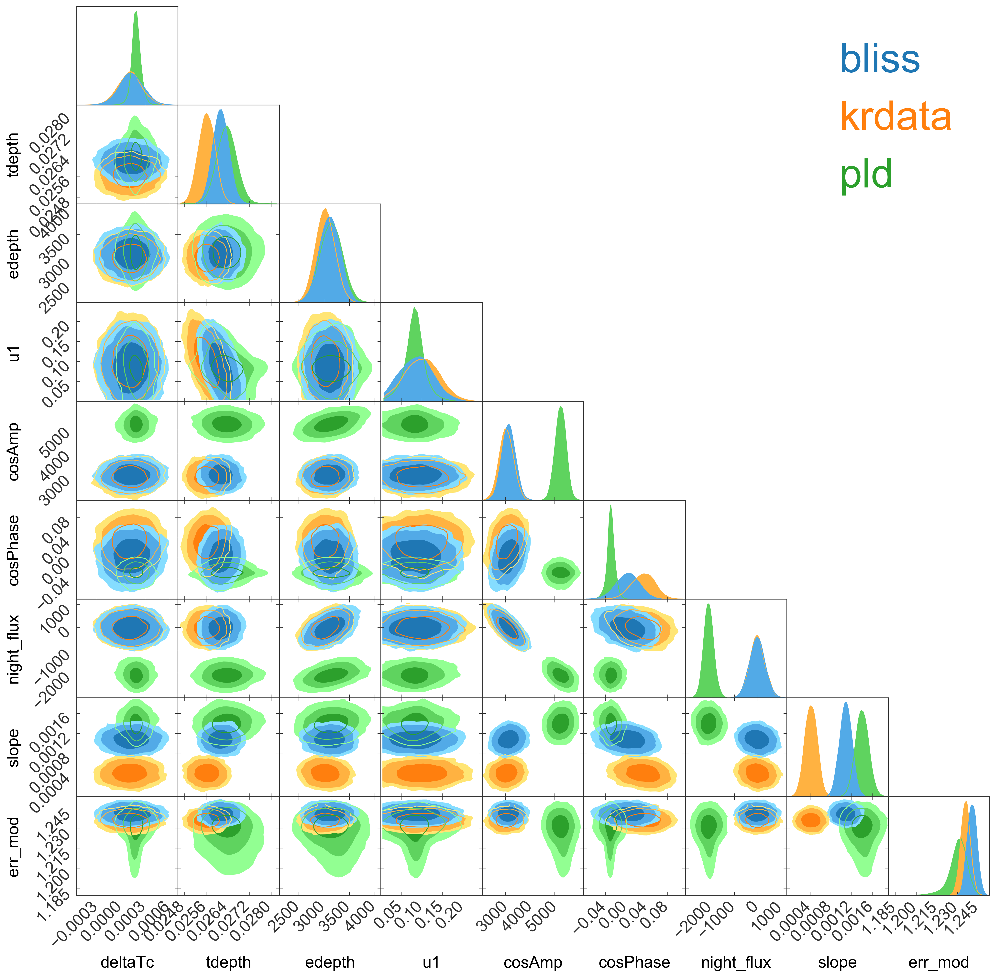

In [15]:
thingies = [val.flatchain.drop([colname for colname in val.flatchain.columns if 'pld' in colname or 'weird' in colname or 'deltaEc' in colname or 't_start' in colname], axis=1) for val in mcmc_stack['ch2'].values()]

for thingy in thingies: thingy['cosAmp'] = thingy['cosAmp']*ppm
for thingy in thingies: thingy['night_flux'] = thingy['night_flux']*ppm
for thingy in thingies: thingy['edepth'] = thingy['cosAmp']*np.cos(thingy['cosPhase']) + thingy['night_flux']

pygtc_out = pygtc.plotGTC(thingies, figureSize=20, nContourLevels=3, 
                          customLegendFont={'family':'Arial', 'size':50},
                          customLabelFont={'family':'Arial', 'size':20},
                          customTickFont={'family':'Arial', 'size':20},
                          chainLabels = list(mcmc_stack['ch2'].keys()))

# for thingy in thingies: thingy['edepth'] = thingy['cosAmp']*np.cos(thingy['cosPhase']) + thingy['night_flux']

pygtc_save_name = '{}_{}_{}_{}_{}_{}_pygtc_combo_cornerplot.png'.format(planet_name.replace(' ',''), 'ch2', staticRad, varRad, 'all3', 'mcmc')
print('Saving PyGTC {} to {}'.format('ch1', pygtc_save_name))
# pygtc_out.savefig(pygtc_save_name)

# Plot Individual Channels and Methods

In [2]:
time_stamp = 20180909043517

planet_name = 'qatar2_planet_params.json'
method = 'bliss'
# method = 'krdata'
# method = 'pld'; pld_order = 3

channel = 'ch2'
staticRad = 2.5
varRad = 0.0
dataDir = '/Users/jonathan/Research/Planets/PhaseCurves/' + '{}_full_output_for_pipeline_{}_{:.1f}_{:.1f}.joblib.save'.format(planet_name.split('_')[0], channel, staticRad, varRad)

x_bin_size = 0.01
y_bin_size = 0.01
do_mcmc = False

In [3]:
# transit_type='secondary'
x_sigma_range = 4
y_sigma_range = 4
f_sigma_range = 4

In [4]:
init_u1, init_u2, init_u3, init_u4, init_fpfs = None, None, None, None, None

if planet_name[-5:] == '.json':
    with open(planet_name, 'r') as file_in:
        planet_json = json.load(file_in)
    init_period = planet_json['period']
    init_t0     = planet_json['t0']
    init_aprs   = planet_json['aprs']
    init_inc    = planet_json['inc']
    
    if 'tdepth' in planet_json.keys():
        init_tdepth   = planet_json['tdepth']
    elif 'rprs' in planet_json.keys():
        init_tdepth   = planet_json['rprs']**2
    elif 'rp' in planet_json.keys():
        init_tdepth   = planet_json['rp']**2
    else:
        raise ValueError("Either `tdepth` or `rprs` or `rp` (in relative units) \
                            must be included in {}".format(planet_name))
    
    init_fpfs   = planet_json['fpfs'] if 'fpfs' in planet_json.keys() else 2000 / ppm
    init_ecc    = planet_json['ecc']
    init_omega  = planet_json['omega']
    init_u1     = planet_json['u1'] if 'u1' in planet_json.keys() else None
    init_u2     = planet_json['u2'] if 'u2' in planet_json.keys() else None
    init_u3     = planet_json['u3'] if 'u3' in planet_json.keys() else None
    init_u4     = planet_json['u4'] if 'u4' in planet_json.keys() else None
    
    if 'planet name' in planet_json.keys():
        planet_name = planet_json['planet name']
    else:
        # Assume the json file name is the planet name
        #   This is a bad assumption; but it is one that users will understand
        print("'planet name' is not inlcude in {};".format(planet_name), end=" ")
        planet_name = planet_name.split('.json')[0]
        print(" assuming the 'planet name' is {}".format(planet_name))
else:
    init_period, init_t0, init_aprs, init_inc, init_tdepth, init_ecc, init_omega = exoparams_to_lmfit_params(planet_name)

init_fpfs = 50 / ppm if init_fpfs is None else init_fpfs
init_u1   = 0.1 if init_u1 is None else init_u1
init_u2   = 1e-6 if init_u2 is None else init_u2
init_u3   = 1e-6 if init_u3 is None else init_u3
init_u4   = 1e-6 if init_u4 is None else init_u4

NameError: name 'ppm' is not defined

In [6]:
print('Acquiring Data')

data_in = utils.setup_inputs_from_file(dataDir, x_bin_size=x_bin_size, y_bin_size=y_bin_size, xSigmaRange=x_sigma_range, 
                                       ySigmaRange=y_sigma_range, fSigmaRange=f_sigma_range, flux_key='phots', 
                                       time_key='times', flux_err_key='noise', eff_width_key = 'npix', 
                                       pld_coeff_key = 'pld', ycenter_key='ycenters', xcenter_key='xcenters', 
                                       ywidth_key='ywidths', xwidth_key='xwidths', method=method)

fluxes, times, flux_errs, npix, pld_intensities0, xcenters, ycenters, xwidths, ywidths, \
    knots, nearIndices, keep_inds, ind_kdtree, gw_kdtree = data_in

# Only use the valid values
fluxes = fluxes[keep_inds]
times = times[keep_inds]
flux_errs = flux_errs[keep_inds]
npix = npix[keep_inds]
xcenters = xcenters[keep_inds]
ycenters = ycenters[keep_inds]
xwidths = xwidths[keep_inds]
ywidths = ywidths[keep_inds]

# Normalize fluxes and flux errors around 1
flux_errs = flux_errs/np.median(fluxes)
fluxes = fluxes/np.median(fluxes)

Acquiring Data
Setting up inputs for bliss.
Setting up BLISS
BLISS will use a total of 1156 knots


In [7]:
print('Fixing Time Stamps')
len_init_t0 = len(str(int(init_t0)))
len_times = len(str(int(times.mean())))

# Check if `init_t0` is in JD or MJD
if len_init_t0 == 7 and len_times != 7:
    if len_times == 5:
        init_t0 = init_t0 - 2400000.5
    elif len_times == 4:
        init_t0 = init_t0 - 2450000.5
    else:
        raise ValueError('The `init_t0` is {} and `times.mean()` is {}'.format(int(init_t0), int(times.mean())))

# Check if `init_t0` is in MJD or Simplified-MJD
if len(str(int(init_t0))) > len(str(int(times.mean()))): init_t0 = init_t0 - 50000

Fixing Time Stamps


In [12]:
nSig = 10
max_phase = 90/180*np.pi

print('Initializing Parameters')
initialParams = Parameters()
initialParams.add_many(
    ('period', init_period, False), #, init_period, init_period), # maybe set this to make MCMC static
    ('deltaTc', 1e-3, True, -0.025, 0.025),
    # ('deltaEc', 1e-3, True, -0.025, 0.025),
    ('deltaEc', 0.0, False, -0.05, 0.05),
    ('inc', init_inc, False, 80.0, 90.),
    ('aprs', init_aprs, False, 0.0, 100.),
    ('tdepth', init_tdepth, True, 0.0, 0.3 ), 
    ('edepth', init_fpfs, True, 0.0, 0.1),
    ('ecc', init_ecc, False, 0.0, 1.0 ),
    ('omega', init_omega, False, -180, 180 ),
    ('u1', init_u1 , True, 0.0, 1.0 ),
    # ('u2', init_u2 , True, 0.0, 1.0 ),
    ('u2', 0.0 , False, 0.0, 1.0 ),
    ('cosAmp', 1e-3, True, 0, 1),
    ('cosPhase', 1e-3, True, -max_phase, max_phase),
    ('night_flux', 1e-3, True, 0.0, 1.0),
    ('tCenter', init_t0 , False),
    ('intercept', 1.005 , False, 1-np.std(fluxes)*nSig, 1+np.std(fluxes)*nSig),
    ('slope', 1e-2, True),
    ('curvature', 0.0 , False))

if channel == 'ch1' and planet_name == 'Qatar-2 b':
    print("Adding Weirdness")
    initialParams.add_many(('t_start', 0.135, True, 0.125, 0.150),
                           ('weirdintercept', 1-0.01, True),
                           ('weirdslope', 0.00, True)
                          )

add_unity = True
n_ppm = 1.0
verbose = True
do_pca = True
do_std = True
pca_cut = True
start_unity = False
# Normalize pld pixel values and estimate initial parameters
if method.lower() == 'pld':
    pldints = [pld_now[keep_inds] for pld_now in pld_intensities0]
    pld_intensities = pld.normalize_pld(np.array(pldints))
    
    n_pld, _ = pld_intensities.shape
    
    if verbose: print('Initializing PLD coefficients.')
    initialParams, pld_intensities = models.add_pld_params(initialParams, fluxes=fluxes, pld_intensities=pld_intensities0, add_unity=add_unity, n_pld=n_pld, 
                                                               n_ppm=n_ppm, order=pld_order, verbose=verbose, do_pca=do_pca, do_std=do_std, pca_cut=pca_cut, start_unity=start_unity)
else:
    pld_intensities = pld_intensities0.copy()

Initializing Parameters


# Load MCMC Chains

In [10]:
do_pca = True

if 'pld' in method.lower() and do_pca and 'pca' not in method.lower(): method = 'pca_' + method

n_steps = 1000
n_walkers = 100

emcee_save_name = '{}_{}_{}_{}_{}_{}_{}steps_{}walkers_{}.joblib.save'.format(planet_name.replace(' ',''), channel, staticRad, varRad, method, 
                                                                'mcmc', n_steps, n_walkers, time_stamp)

print('Loading EMCEE from {}'.format(save_dir + emcee_save_name))
res = joblib.load(save_dir + emcee_save_name)

report_errors(res.params)

Loading EMCEE from /Users/jonathan/Research/Planets/PhaseCurves/Keep_For_Now/Qatar-2b_ch2_2.5_0.0_bliss_mcmc_1000steps_100walkers_20180909043517.joblib.save
[[Variables]]
    period:      1.337117 (fixed)
    deltaTc:     8.9483e-05 +/- 1.4302e-04 (159.83%) (init = 0.001)
    deltaEc:     0.00143100 +/- 9.0274e-04 (63.08%) (init = 0.001)
    inc:         88.99 (fixed)
    aprs:        6.51466 (fixed)
    tdepth:      0.02620172 +/- 3.0580e-04 (1.17%) (init = 0.0266587)
    edepth:      0.03101171 +/- 0.03438127 (110.87%) (init = 0.002)
    ecc:         0 (fixed)
    omega:       180 (fixed)
    u1:          0.08213058 +/- 0.04085991 (49.75%) (init = 0.1)
    u2:          0 (fixed)
    cosAmp:      0.00295484 +/- 2.2124e-04 (7.49%) (init = 0.001)
    cosPhase:    0.02623949 +/- 0.04125592 (157.23%) (init = 0.001)
    night_flux:  2.2280e-04 +/- 2.0954e-04 (94.05%) (init = 0.001)
    tCenter:     57249.7 (fixed)
    intercept:   1 (fixed)
    slope:       0.00105775 +/- 1.1294e-04 (10.68

Establishing the mcmc_1000_100 Solution
Saving Initial Fit Residuals Plot to Qatar-2b_ch2_2.5_0.0_bliss_mcmc_1000_100_fit_residuals_physics_20180909043517.png


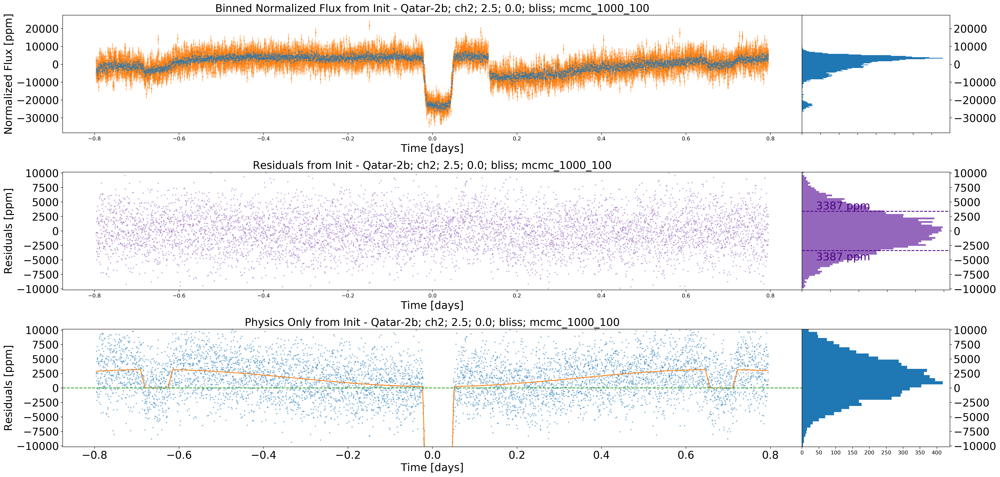

In [13]:
mcmc_model_set = synod.generate_best_fit_solution(res.params, 
                                                times = times, 
                                                xcenters = xcenters, 
                                                ycenters = ycenters, 
                                                fluxes = fluxes, 
                                                knots = knots, 
                                                keep_inds = keep_inds, 
                                                method = method, 
                                                nearIndices = nearIndices, 
                                                ind_kdtree = ind_kdtree, 
                                                gw_kdtree = gw_kdtree, 
                                                pld_intensities = pld_intensities, 
                                                x_bin_size = x_bin_size, 
                                                y_bin_size = y_bin_size)

plot_fit_residuals_physics(times, fluxes, flux_errs, mcmc_model_set, plot_name='mcmc_{}_{}'.format(n_steps, n_walkers), planet_name=planet_name, 
                           channel=channel, staticRad=staticRad, varRad=varRad, method=method, time_stamp=time_stamp, save_now=True, save_dir=save_dir)

Saving corner plot to /Users/jonathan/Research/Planets/PhaseCurves/Keep_For_Now/Qatar-2b_ch2_2.5_0.0_bliss_mle_emcee_cornerplot_20180909043517.png


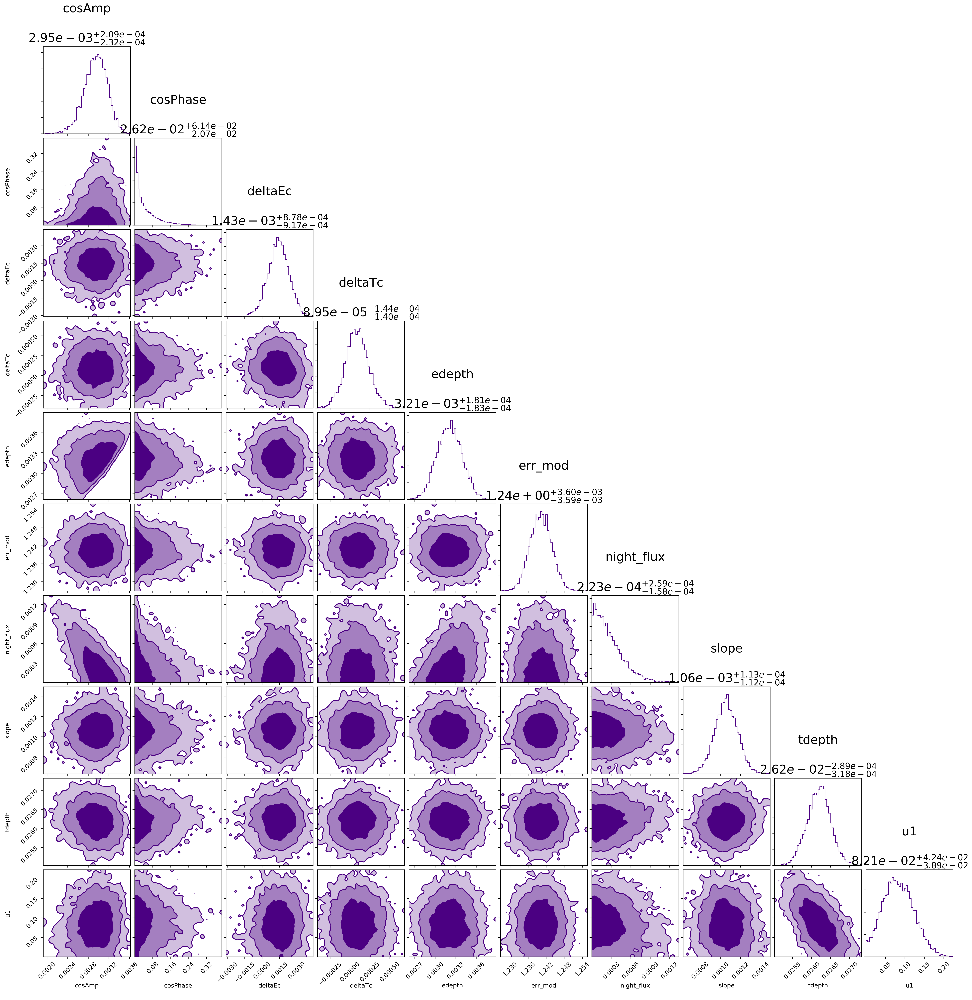

In [14]:
res_var_names = np.array(res.var_names)
res_flatchain = np.array(res.flatchain)
res_df = DataFrame(res_flatchain.copy(), columns=res_var_names)

# Do not corner plot the PLD coefficients directly.
if 'pld' in method.lower(): res_df.drop([vname for vname in res_var_names if 'pld' in vname], axis=1, inplace=True)

res_df.sort_index('columns', inplace=True)
# res_df = res_df.drop(['u2','slope'], axis=1)
res_df['edepth'] = res_df['night_flux'] + res_df['cosAmp']*np.cos(res_df['cosPhase'])
# nSig = 6
# ranges = [(np.mean(val) - nSig*np.std(val), np.mean(val) - nSig*np.std(val)) for key,val in res_df.items()]

def add_newline(label): return label + '\n'

color = 'indigo'

n_sigma = 3
levels = [0.682689492137, 0.954499736104, 0.997300203937, 0.999936657516, 0.999999426697, 0.999999998027]

title_kwargs = dict(columnwise = True)

corner_kwargs = {}
corner_kwargs['color'] = color
corner_kwargs['labels'] = list(map(add_newline,res_df.columns))
corner_kwargs['plot_datapoints'] = False
corner_kwargs['bins'] = 50
corner_kwargs['plot_density'] = False
corner_kwargs['smooth'] = True
corner_kwargs['fill_contours'] = True
corner_kwargs['levels'] = levels[:n_sigma]
corner_kwargs['show_titles'] = True
corner_kwargs['title_fmt'] = '0.2e'
corner_kwargs['columnwise_titles'] = True
corner_kwargs['title_kwargs'] = dict(fontsize=20)

corner.corner(res_df, **corner_kwargs)

corner_save_name = '{}_{}_{}_{}_{}_{}_emcee_cornerplot_{}.png'.format(planet_name.replace(' b','b'), channel, staticRad, 
                                                                      varRad, method, fit_type[do_mcmc], time_stamp)
print('Saving corner plot to {}'.format(save_dir + corner_save_name))
plt.savefig(corner_save_name)

In [15]:
if 'pld' in method.lower():
    res_var_names = np.array(res.var_names)
    res_flatchain = np.array(res.flatchain)
    res_df = DataFrame(res_flatchain.copy(), columns=res_var_names)
    
    # Do not corner plot the PLD coefficients directly.
    res_df = res_df[[vname for vname in res_var_names if 'pld' in vname]]
    
    def add_newline(label): return label + '\n'
    
    color = 'indigo'
    
    n_sigma = 3
    levels = [0.682689492137, 0.954499736104, 0.997300203937, 0.999936657516, 0.999999426697, 0.999999998027]
    
    title_kwargs = dict(columnwise = True)
    
    corner_kwargs = {}
    corner_kwargs['color'] = color
    corner_kwargs['labels'] = list(map(add_newline,res_df.columns))
    corner_kwargs['plot_datapoints'] = False
    corner_kwargs['bins'] = 50
    corner_kwargs['plot_density'] = False
    corner_kwargs['smooth'] = True
    corner_kwargs['fill_contours'] = True
    corner_kwargs['levels'] = levels[:n_sigma]
    corner_kwargs['show_titles'] = True
    corner_kwargs['title_fmt'] = '0.2e'
    corner_kwargs['columnwise_titles'] = True
    corner_kwargs['title_kwargs'] = dict(fontsize=20)
    
    corner.corner(res_df, **corner_kwargs)
    
    corner_save_name = '{}_{}_{}_{}_{}_{}_PLDCoeffs_emcee_cornerplot_{}.png'.format(planet_name.replace(' b','b'), channel, staticRad, 
                                                                          varRad, method, fit_type[do_mcmc], time_stamp)
    print('Saving PLD corner plot to {}'.format(save_dir + corner_save_name))
    plt.savefig(save_dir + corner_save_name)

In [16]:
res_df.describe()

,cosAmp,cosPhase,deltaEc,deltaTc,edepth,err_mod,night_flux,slope,tdepth,u1
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8.000000e+03,8000.000000,8000.000000,8000.000000
mean,0.002943,0.044593,0.001413,0.000091,0.003209,1.240248,2.730182e-04,0.001057,0.026192,0.084056
std,0.000224,0.048997,0.000910,0.000147,0.000181,0.003574,2.160569e-04,0.000114,0.000308,0.039475
min,0.001929,0.000012,-0.003092,-0.000409,0.002616,1.226772,3.680060e-08,0.000634,0.025028,0.000086
25%,0.002799,0.009013,0.000824,-0.000006,0.003083,1.237805,1.052797e-04,0.000982,0.025985,0.055577
50%,0.002955,0.026239,0.001431,0.000089,0.003209,1.240248,2.228027e-04,0.001058,0.026202,0.082131
75%,0.003101,0.064214,0.002024,0.000185,0.003335,1.242654,3.897711e-04,0.001134,0.026396,0.110855
max,0.003618,0.387690,0.004400,0.000686,0.003888,1.255715,1.340429e-03,0.001492,0.027316,0.223859
